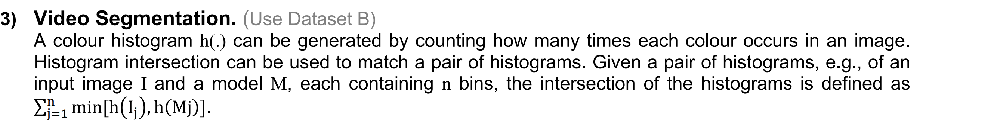

In [28]:
#import required packages (PIL and Image are ONLY used for read and write images)
import numpy as np
from PIL import Image
import math
import matplotlib.pyplot as plt

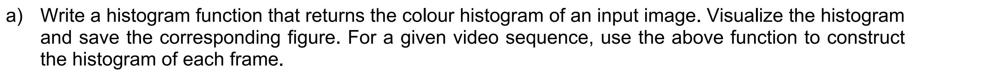

In [29]:
# plot 3 histograms for each RGB channel of an image with frame number and save the histograms
def create_histograms_of_frame(image, frame_number):
    
    # create np array 1x256 for each RGB channel 
    # each column represent colors between 0..255 for each channel
    histogram = np.zeros(shape = (1,256,3))
    
    #for each channel: I iterate through 2D array and increase the counter of the index which is equal to the color value
    for k in range(image.shape[2]):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                h = image[i,j,k]
                histogram[0,image[i,j,k],k] += 1
    
    # I plot 3 histograms(for each channel) and save the result         
    plt.figure(figsize=(12, 4))
    plt.subplot(131)  
    plt.plot(histogram[0, :, 0], color='red')
    plt.title('Red')

    plt.subplot(132) 
    plt.plot(histogram[0, :, 1], color='green')
    plt.title('Green')

    plt.subplot(133)  
    plt.plot(histogram[0, :, 2], color='blue')
    plt.title('Blue')

    plt.tight_layout()  
    
    plt.savefig('histogram/frame_{}.png'.format(frame_number))
    plt.show()
    return histogram


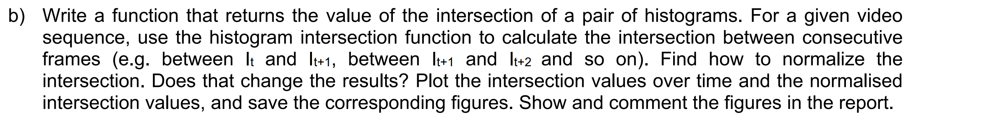

In [44]:
# calculates intersection value and normalised intersection value of two histograms and return it
def intersection(h_1, h_2):
    
    # for each channel we have 2 values sum of the minimum of elements of the 2 histograms and sum of the max of them
    min_sum = np.zeros((1,3))
    max_sum = np.zeros((1,3))
    
    # for each channel we iterate through both histograms and calculate min and max of each 2 corresponding elements
    # then we sum mins and maxs for each channel and store them
    for k in range(h_1.shape[2]):
        for j in range(h_1.shape[1]):
            
            min_sum[0, k] += min(h_1[0, j, k], h_2[0, j, k])
            max_sum[0, k] += max(h_1[0, j, k], h_2[0, j, k])
   
    # the intersection value is average of sum of mins for each channel 
    # the normalised intersection value is sum of mins for each channel over sum of maxs for each channel
    
    return np.sum(min_sum)/3, np.sum(min_sum)/np.sum(max_sum)
            

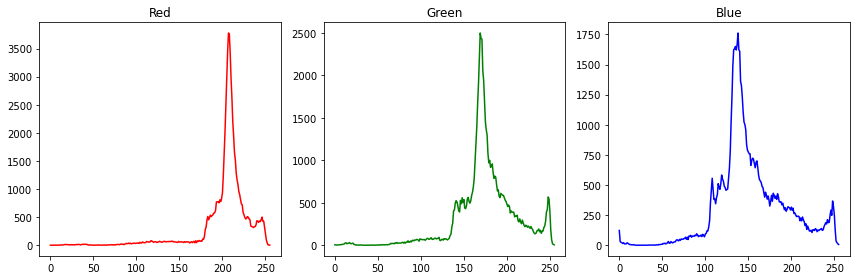

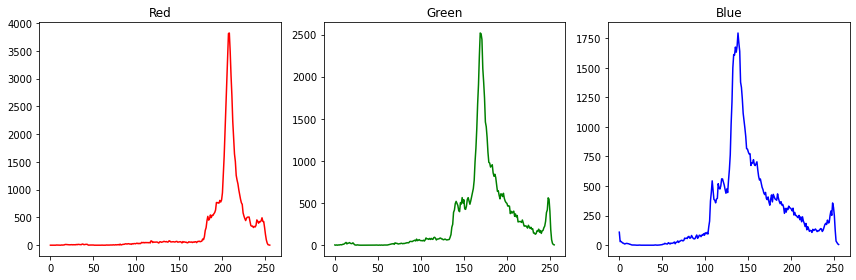

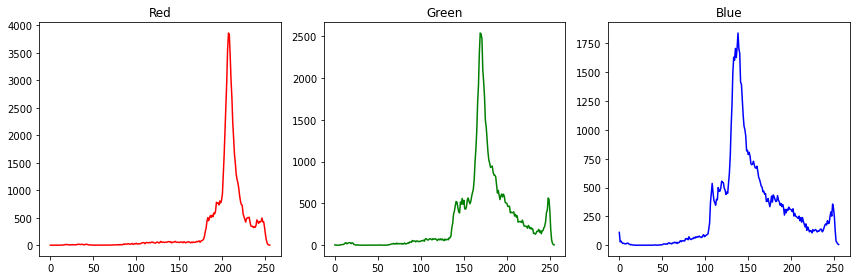

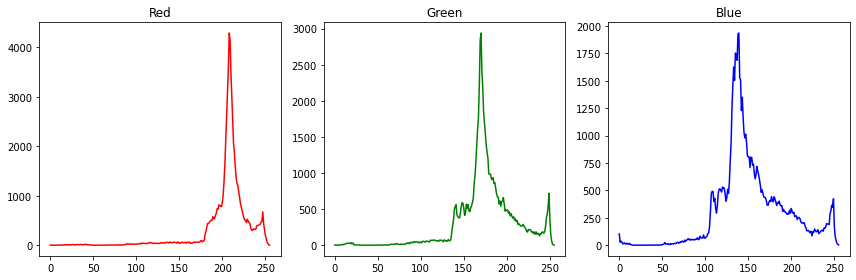

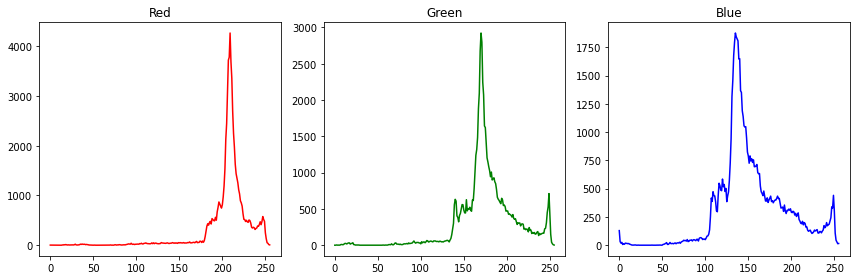

...

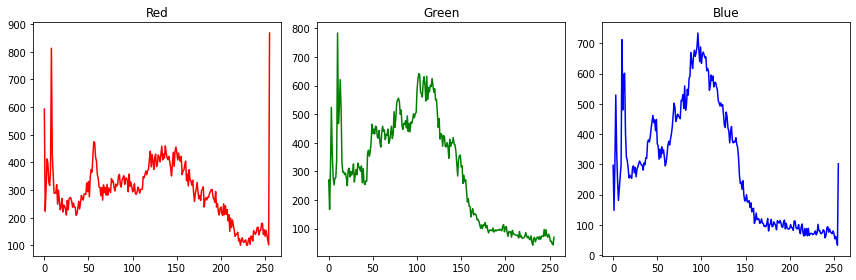

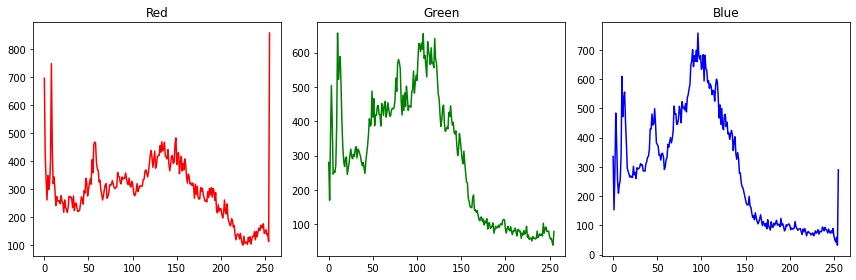

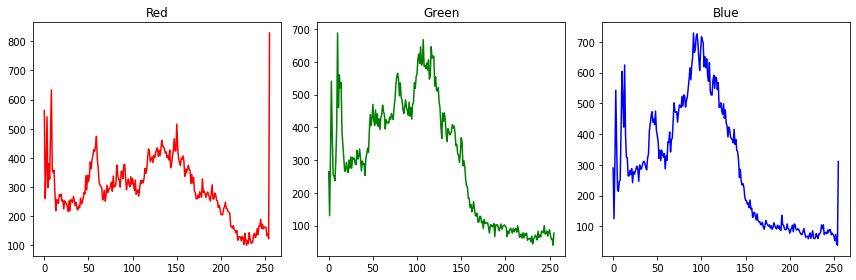

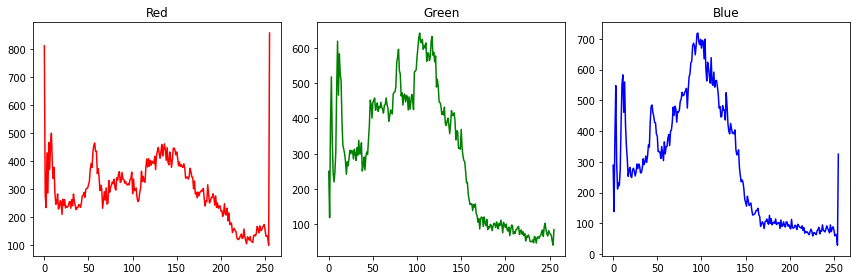

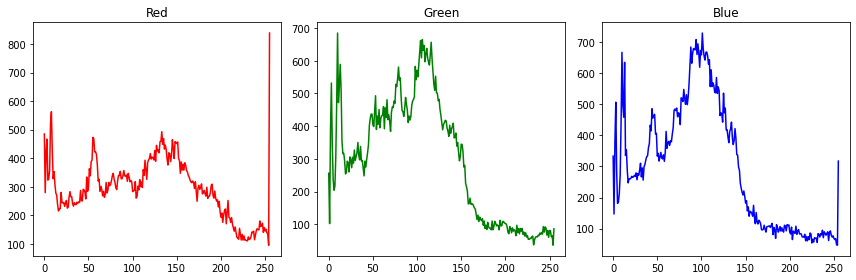

In [31]:
import cv2

# open video file using cv for defined path
video_capture = cv2.VideoCapture('Dataset//DatasetB.avi') 

# handel open error
if not video_capture.isOpened():
    print("Error: Could not open video file.")
    exit()

# reading each frame through loop and store it in the list
# create a histogram from each fram and append it to the list
i = 0
video_histograms = []
frames = []
while True:
    ret, frame = video_capture.read()
    frames.append(frame)
    #check if we reach to the end of the video file break the loop
    if not ret:
        break  

    histograms = create_histograms_of_frame(frame,i)
    video_histograms.append(histograms)
    i+=1

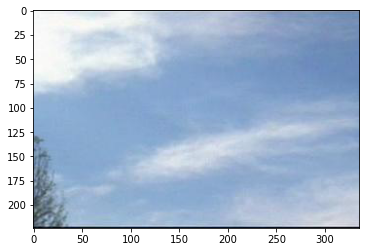

In [55]:
# plot to consecutive frames
plt.imshow(cv2.cvtColor(frames[8], cv2.COLOR_BGR2RGB))

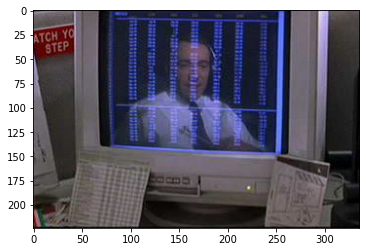

In [52]:
plt.imshow(cv2.cvtColor(frames[9], cv2.COLOR_BGR2RGB))

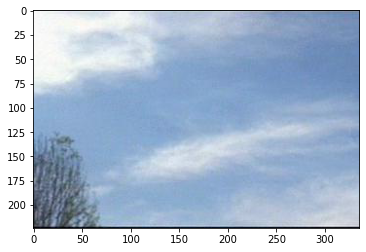

In [53]:
# plot a non-consecutive frame
plt.imshow(cv2.cvtColor(frames[0], cv2.COLOR_BGR2RGB))

In [56]:
# calculate the intersection of two consecutive frames
value, normalised_value = intersection(video_histograms[8],video_histograms[9])
print(value)

7562.0


In [57]:
# calculate the intersection of two non-consecutive frames
value, normalised_value = intersection(video_histograms[0],video_histograms[9])
print(value)

10284.333333333334


In [45]:
# calculate intersection, and normalised intersection for each two consecutive frames of the video 
# and append them to the lists
intersections = []  
normalised_intersections = []  

for index in range(len(video_histograms)-1):
    
    value, normalised_value = intersection(video_histograms[index],video_histograms[index + 1])
    intersections.append(value)
    normalised_intersections.append(normalised_value)

video_capture.release()
cv2.destroyAllWindows()

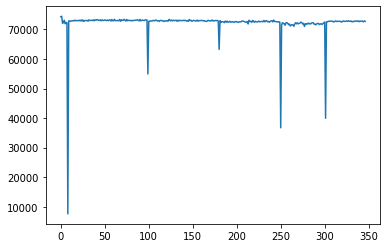

In [46]:
# plot intersections of consecutive frames over video 
plt.plot(intersections)
plt.savefig('histogram_intersection/intersection.png')

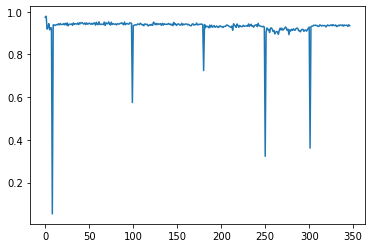

In [47]:
# plot normalised intersections of consecutive frames over video
plt.plot(normalised_intersections)
plt.savefig('histogram_intersection/normalised_intersection.png')